In [4]:
# install required libraries
!pip install seaborn -q
!pip install plotly-geo -q
!pip install geopandas -q
!pip install pyshp -q
!pip install shapely -q
!pip install -U kaleido -q
!pip install numba==0.58.1 -q

In [5]:
import warnings
warnings.filterwarnings("ignore")

In [6]:
# import required libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from urllib.request import urlopen
import json
import plotly.express as px

import plotly.figure_factory as ff

# base path for where the WRF-HRRR data has been stored
base_path = "/kaggle/input/cropnet/HRRR"

In [7]:
# file path for accessing a particular file
file_path = "2017/AL/HRRR_01_AL_2017-01.csv"

path = os.path.join(base_path, file_path)
df = pd.read_csv(path)

df.head()

,Year,Month,Day,Daily/Monthly,State,County,FIPS Code,Grid Index,Lat (llcrnr),Lon (llcrnr),...,Max Temperature (K),Min Temperature (K),Precipitation (kg m**-2),Relative Humidity (%),Wind Gust (m s**-1),Wind Speed (m s**-1),U Component of Wind (m s**-1),V Component of Wind (m s**-1),Downward Shortwave Radiation Flux (W m**-2),Vapor Pressure Deficit (kPa)
0,2017,1,1.0,Daily,ALABAMA,AUTAUGA,1001,0.0,32.340803,-86.917595,...,290.994,282.193,42.016,96.5,4.848,5.123,-4.124,2.594,75.0,0.055
1,2017,1,2.0,Daily,ALABAMA,AUTAUGA,1001,0.0,32.340803,-86.917595,...,292.887,289.154,64.633,95.5,5.520,5.616,-4.324,2.171,157.5,0.090
2,2017,1,3.0,Daily,ALABAMA,AUTAUGA,1001,0.0,32.340803,-86.917595,...,292.244,288.020,12.060,90.5,5.229,4.135,0.829,1.566,1211.7,0.188
3,2017,1,4.0,Daily,ALABAMA,AUTAUGA,1001,0.0,32.340803,-86.917595,...,289.156,282.520,0.026,84.3,4.642,4.468,2.568,-2.915,733.0,0.208
4,2017,1,5.0,Daily,ALABAMA,AUTAUGA,1001,0.0,32.340803,-86.917595,...,285.549,274.400,0.001,73.7,3.341,3.105,0.367,-1.449,1013.9,0.284


In [9]:
# point to the year's directory
directory = "/kaggle/input/cropnet/HRRR/2017"

# retrieve the weather data for the whole U.S.
def retrieve_us_data(month = "04",year="2017"):
    file_template = year+"-{}.csv"
    targeted_month = file_template.format(month)

    all_data = []
    # iterate over the states
    for state_dir in os.listdir(directory):
        state_path = os.path.join(directory, state_dir)

       # iteratore over the files in the dir
        for file in os.listdir(state_path):
            if file.endswith(targeted_month):
          # full path to file
              file_path = os.path.join(state_path, file)
              df = pd.read_csv(file_path)
          # only consifer the monthly data for visualization
              df = df[df["Daily/Monthly"] == "Monthly"]
          # hanlde the fips code
              df["FIPS Code"] = df["FIPS Code"].astype(str).str.zfill(5)
              all_data.append(df)

    # concatenate all dfs into a single one
    us_data = pd.concat(all_data)
    return us_data

    # read the data across the U.S. continent
us_data = retrieve_us_data(month = "01",year="2017")

In [10]:
# visualize the U.S. map
county_url = 'https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json'
with urlopen(county_url) as response:
    counties = json.load(response)

fig = px.choropleth(us_data, geojson=counties, locations='FIPS Code', color='Avg Temperature (K)',
                           color_continuous_scale="Jet",
                           range_color=(260, 300),
                           scope="usa",
                           labels={'Avg Temperature (K)':'Temperature (K)'}
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [11]:
# retrieve the meteorological data for one U.S. state
def retrieve_one_state_data(months = [str(i+1) for i in range(12)],year="2017"):
    all_data = []
    path_template = f"2017/AL/HRRR_01_AL_{year}-"+"{}.csv"
    # read the data for targeted months
    for m in months:
        tmp_file_path = path_template.format(m.zfill(2))
        tmp_path = os.path.join(base_path, tmp_file_path)
        data = pd.read_csv(tmp_path)
        all_data.append(data)

    df = pd.concat(all_data)
    df["FIPS Code"] = df["FIPS Code"].astype(str).str.zfill(5)

    state_data = df[df["Daily/Monthly"] == "Monthly"]
    state_data['Relative Humidity (%)'] = state_data['Relative Humidity (%)'].round(2)

    return state_data

In [12]:
# read the HRRR data 2017-01, ALABAMA
state_data = retrieve_one_state_data(['01'])
state_data

,Year,Month,Day,Daily/Monthly,State,County,FIPS Code,Grid Index,Lat (llcrnr),Lon (llcrnr),...,Max Temperature (K),Min Temperature (K),Precipitation (kg m**-2),Relative Humidity (%),Wind Gust (m s**-1),Wind Speed (m s**-1),U Component of Wind (m s**-1),V Component of Wind (m s**-1),Downward Shortwave Radiation Flux (W m**-2),Vapor Pressure Deficit (kPa)
48732,2017,1,NaN,Monthly,ALABAMA,AUTAUGA,01001,NaN,NaN,NaN,...,291.008731,280.524899,9.976353,75.38,5.348310,4.624368,0.861430,0.946458,2150.252043,0.372703
48733,2017,1,NaN,Monthly,ALABAMA,BALDWIN,01003,NaN,NaN,NaN,...,292.611554,283.517751,8.278273,79.53,5.823993,6.522687,0.534455,1.560764,2654.753622,0.338753
48734,2017,1,NaN,Monthly,ALABAMA,BARBOUR,01005,NaN,NaN,NaN,...,292.464409,280.528583,10.575619,71.96,5.086519,4.066840,0.991070,1.074257,2620.127849,0.454655
48735,2017,1,NaN,Monthly,ALABAMA,BIBB,01007,NaN,NaN,NaN,...,290.316014,280.577341,9.272012,75.77,5.408226,3.886512,0.602982,1.075613,2010.102621,0.346177
48736,2017,1,NaN,Monthly,ALABAMA,BLOUNT,01009,NaN,NaN,NaN,...,288.717487,279.010620,6.119510,75.81,5.688505,3.141479,0.740923,0.562310,2014.905300,0.314918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48794,2017,1,NaN,Monthly,ALABAMA,TUSCALOOSA,01125,NaN,NaN,NaN,...,290.260738,280.398578,7.326018,75.24,5.524367,4.207545,0.596233,1.258339,2106.952919,0.352219
48795,2017,1,NaN,Monthly,ALABAMA,WALKER,01127,NaN,NaN,NaN,...,289.943692,279.418200,4.871843,74.92,5.357630,3.425918,0.558646,0.883793,2724.956221,0.344864
48796,2017,1,NaN,Monthly,ALABAMA,WASHINGTON,01129,NaN,NaN,NaN,...,292.379788,282.234588,9.442227,77.49,5.461014,6.036720,0.679937,1.501990,2525.491101,0.365310
48797,2017,1,NaN,Monthly,ALABAMA,WILCOX,01131,NaN,NaN,NaN,...,292.053371,281.022088,8.287647,73.84,5.396622,5.422071,1.025331,1.407350,2396.746306,0.420002


In [13]:
# visualize relative humidity for one state
def viz_relative_humidity(state_data,state=['AL']):
    # get all the fips codes for the targeted state
    fips_code = state_data['FIPS Code'].unique()
    # get the relative humidity values
    values = state_data['Relative Humidity (%)'].values
    # set the colorscale (blue)
    colorscale = ["#f7fbff","#ebf3fb","#deebf7","#d2e3f3","#c6dbef","#b3d2e9","#9ecae1",
                "#85bcdb","#6baed6","#57a0ce","#4292c6","#3082be","#2171b5","#1361a9",
                "#08519c","#0b4083","#08306b"]

    # set the endpoints
    endpts = list(np.mgrid[min(values):max(values):16j])

    # create the map
    fig = ff.create_choropleth(fips=fips_code, values=values,
                            state_outline={'color': 'rgb(0,0,0)', 'width': 1},
                            county_outline={'color': 'rgb(255,255,255)', 'width': 0.25},
                            binning_endpoints=endpts, scope=state,
                            title='WRF-HRRR Computed Dataset: 2017 - 01 Alabama', round_legend_values=True,
                            show_state_data=True, simplify_county=0, simplify_state=0,
                            colorscale=colorscale, legend_title='Relative Humidity (%)')
    fig.layout.template = None

    # display the map
    fig.show()


# visualize the relative humidity
viz_relative_humidity(state_data)

In [14]:
# retrive the data for one U.S. county
def retrieve_county_data(FIPS_codes = ["01003"],interval="Monthly"):
    all_data = []
    path_template = "2017/AL/HRRR_01_AL_2017-{}.csv"
    assert interval in ["Monthly","Daily"]
    # read one year's data
    for m in range(12):
        tmp_file_path = path_template.format(str(m+1).zfill(2))
        tmp_path = os.path.join(base_path, tmp_file_path)
        data = pd.read_csv(tmp_path)
        all_data.append(data)

    df = pd.concat(all_data)
    df["FIPS Code"] = df["FIPS Code"].astype(str).str.zfill(5)

    county_data = df[(df["Daily/Monthly"] == interval) & (df["FIPS Code"].isin(FIPS_codes))]
    county_data['Vapor Pressure Deficit (kPa)'] = county_data['Vapor Pressure Deficit (kPa)'].round(2)

    return county_data


# read the meteorological conditions
county_data_monthly = retrieve_county_data(FIPS_codes = ["01003"],interval="Monthly")
county_data_daily = retrieve_county_data(FIPS_codes = ["01003"],interval="Daily")

In [15]:
county_data_monthly.head(3)

,Year,Month,Day,Daily/Monthly,State,County,FIPS Code,Grid Index,Lat (llcrnr),Lon (llcrnr),...,Max Temperature (K),Min Temperature (K),Precipitation (kg m**-2),Relative Humidity (%),Wind Gust (m s**-1),Wind Speed (m s**-1),U Component of Wind (m s**-1),V Component of Wind (m s**-1),Downward Shortwave Radiation Flux (W m**-2),Vapor Pressure Deficit (kPa)
48733,2017,1,NaN,Monthly,ALABAMA,BALDWIN,01003,NaN,NaN,NaN,...,292.611554,283.517751,8.278273,79.527393,5.823993,6.522687,0.534455,1.560764,2654.753622,0.34
44017,2017,2,NaN,Monthly,ALABAMA,BALDWIN,01003,NaN,NaN,NaN,...,294.781755,284.208167,3.225595,78.735012,4.944061,5.789067,0.242102,1.290357,3115.015925,0.41
48733,2017,3,NaN,Monthly,ALABAMA,BALDWIN,01003,NaN,NaN,NaN,...,295.620186,285.691452,2.377797,73.806029,5.850966,6.956325,-1.043729,0.938347,4129.431623,0.55


In [16]:
county_data_daily.head(3)

,Year,Month,Day,Daily/Monthly,State,County,FIPS Code,Grid Index,Lat (llcrnr),Lon (llcrnr),...,Max Temperature (K),Min Temperature (K),Precipitation (kg m**-2),Relative Humidity (%),Wind Gust (m s**-1),Wind Speed (m s**-1),U Component of Wind (m s**-1),V Component of Wind (m s**-1),Downward Shortwave Radiation Flux (W m**-2),Vapor Pressure Deficit (kPa)
465,2017,1,1.0,Daily,ALABAMA,BALDWIN,01003,0.0,30.221132,-88.029272,...,292.733,290.703,3.187,95.2,9.579,12.729,-0.520,12.235,1747.1,0.10
466,2017,1,2.0,Daily,ALABAMA,BALDWIN,01003,0.0,30.221132,-88.029272,...,292.975,289.919,72.528,93.2,6.445,8.816,-2.064,6.288,623.0,0.14
467,2017,1,3.0,Daily,ALABAMA,BALDWIN,01003,0.0,30.221132,-88.029272,...,292.150,288.731,12.498,95.2,6.216,6.914,4.011,2.537,3876.7,0.09


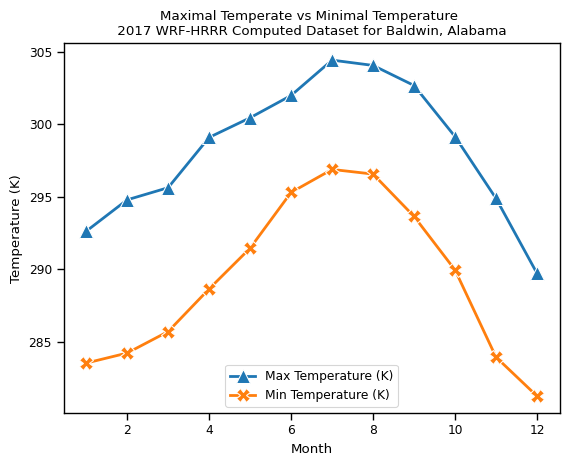

In [18]:
# visualize the maximal and minimal temperate
def viz_max_min_temperature():
    paper_rc = {'lines.linewidth': 2, 'lines.markersize': 10}
    sns.set_context("paper", rc = paper_rc)

    # plot maximal temperature
    chart = sns.lineplot(data=county_data_monthly, x="Month", y="Max Temperature (K)", label='Max Temperature (K)', marker='^')
    # plot minimal temperature
    sns.lineplot(data=county_data_monthly, x="Month", y="Min Temperature (K)", label='Min Temperature (K)', marker='X')

    chart.set_xlabel('Month')
    chart.set_ylabel('Temperature (K)')
    chart.set(title="Maximal Temperate vs Minimal Temperature \n 2017 WRF-HRRR Computed Dataset for Baldwin, Alabama ")

    plt.legend(loc='lower center')

# plot the figure
viz_max_min_temperature()

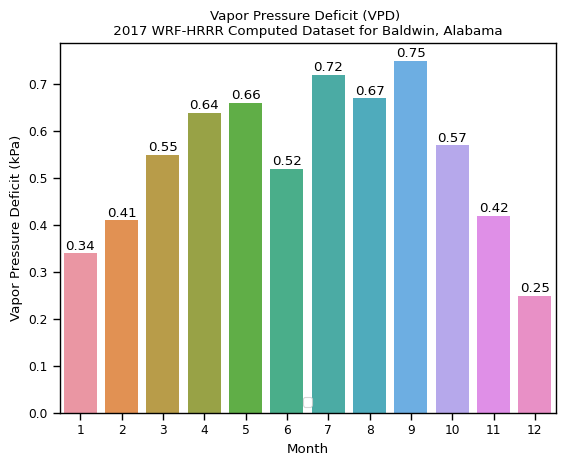

In [19]:
# visualize the vapor pressure deficit (VPD) data
def viz_vpd():
    paper_rc = {'lines.linewidth': 2, 'lines.markersize': 10}
    sns.set_context("paper", rc = paper_rc)

    chart = sns.barplot(data=county_data_monthly, x="Month", y="Vapor Pressure Deficit (kPa)")
    chart.bar_label(chart.containers[0], padding=0.5)

    chart.set_xlabel('Month')
    chart.set_ylabel('Vapor Pressure Deficit (kPa)')
    chart.set(title="Vapor Pressure Deficit (VPD) \n 2017 WRF-HRRR Computed Dataset for Baldwin, Alabama ")

    plt.legend(loc='lower center')

# plot the figure
viz_vpd()

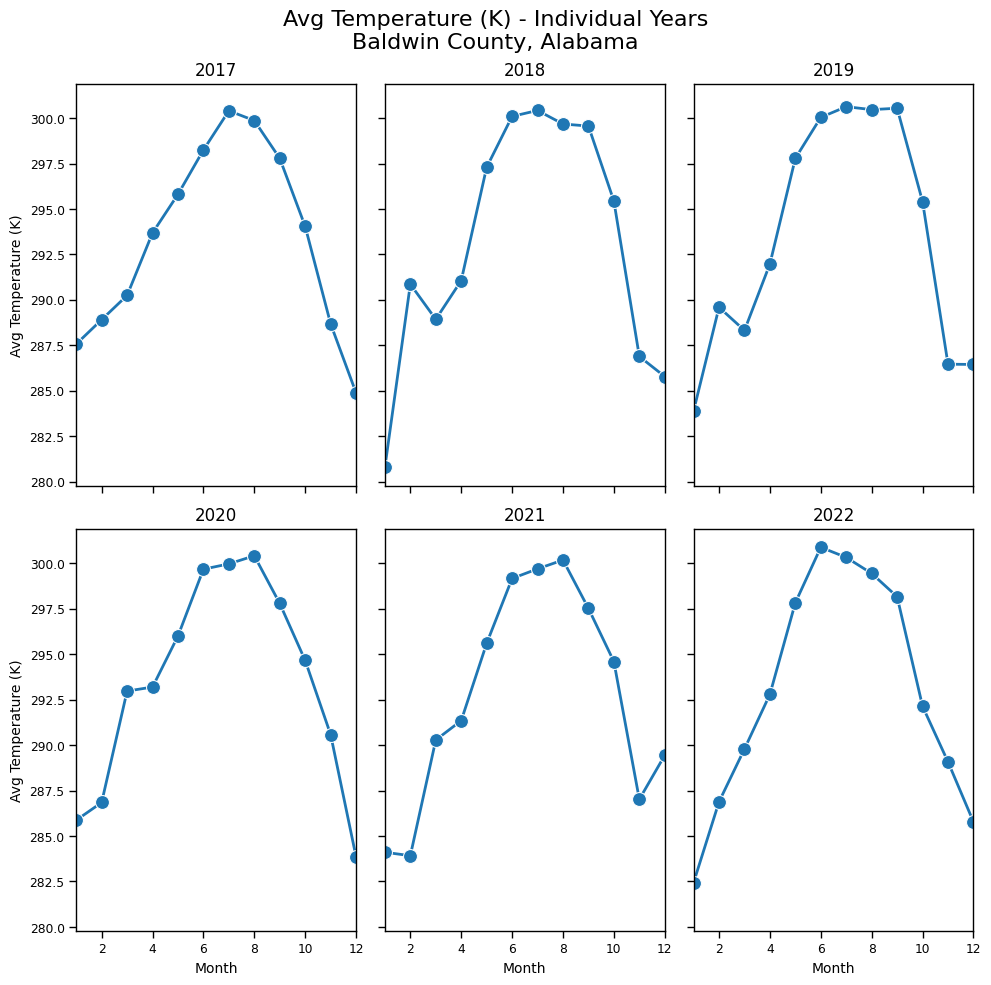

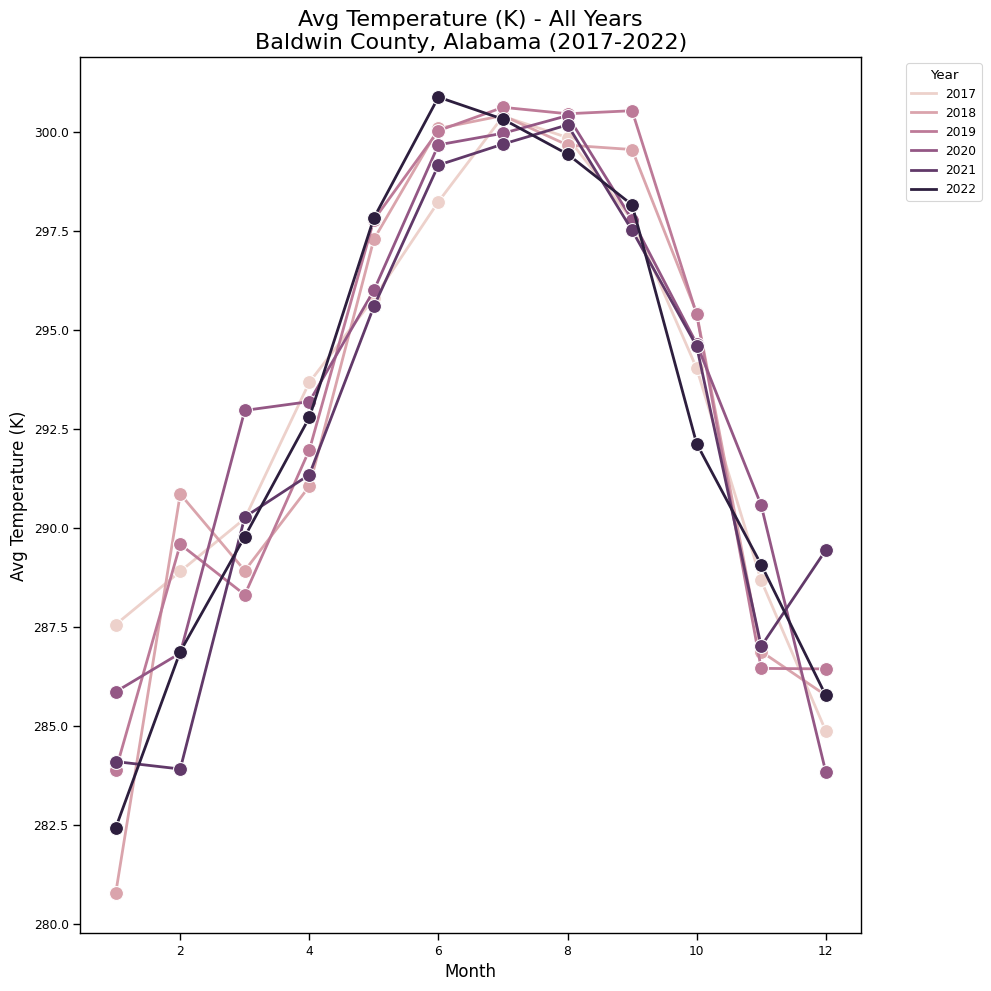

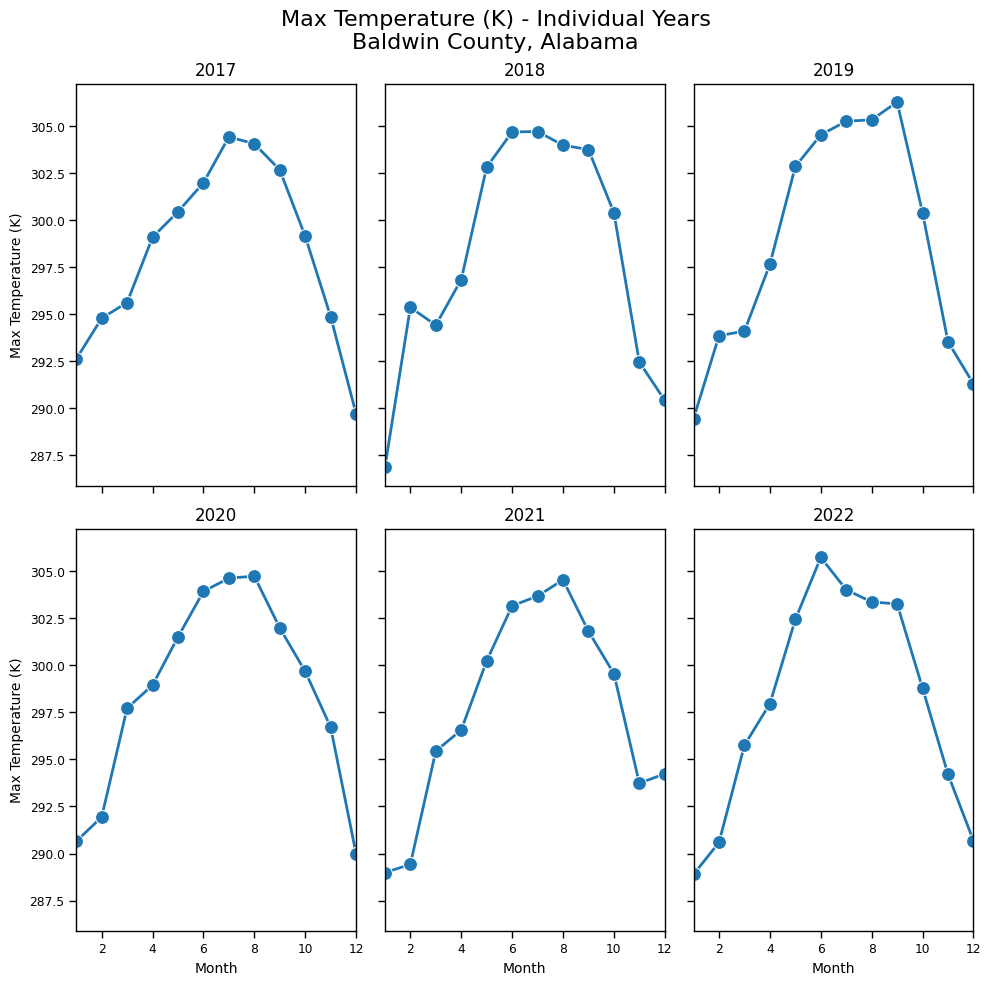

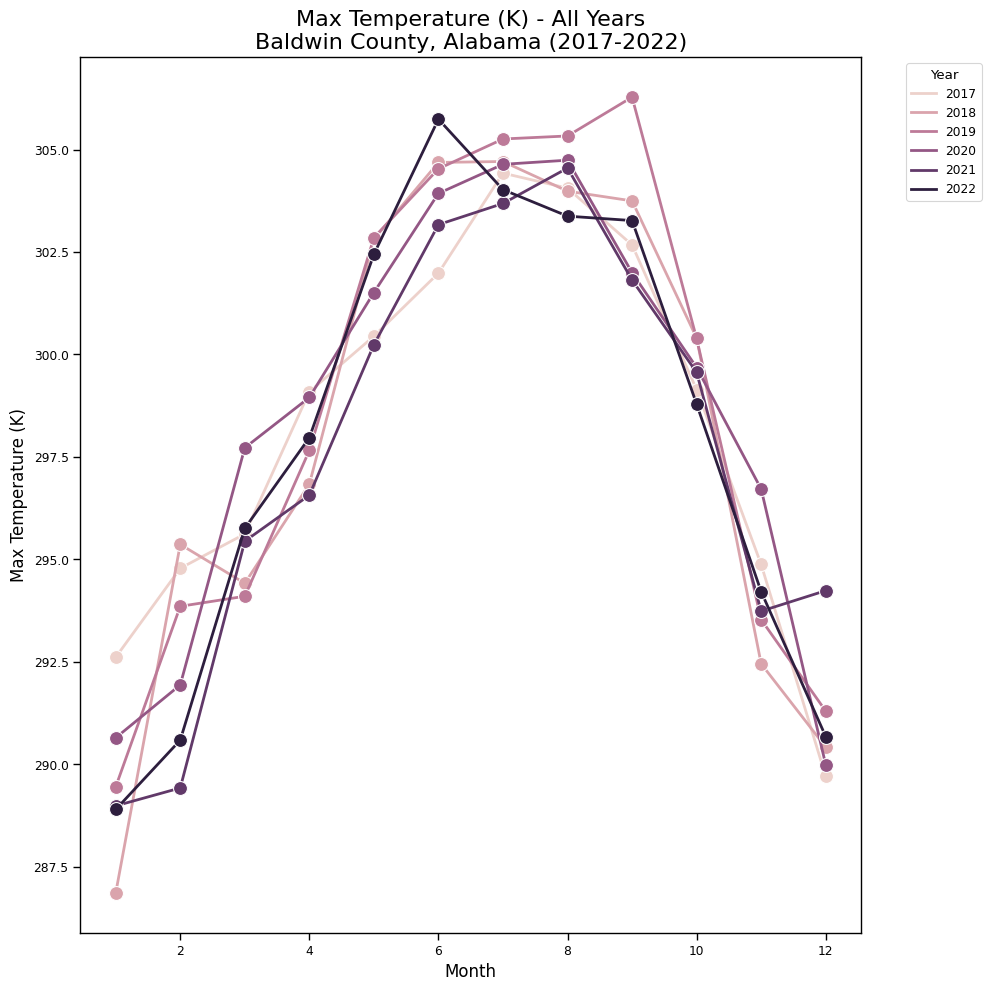

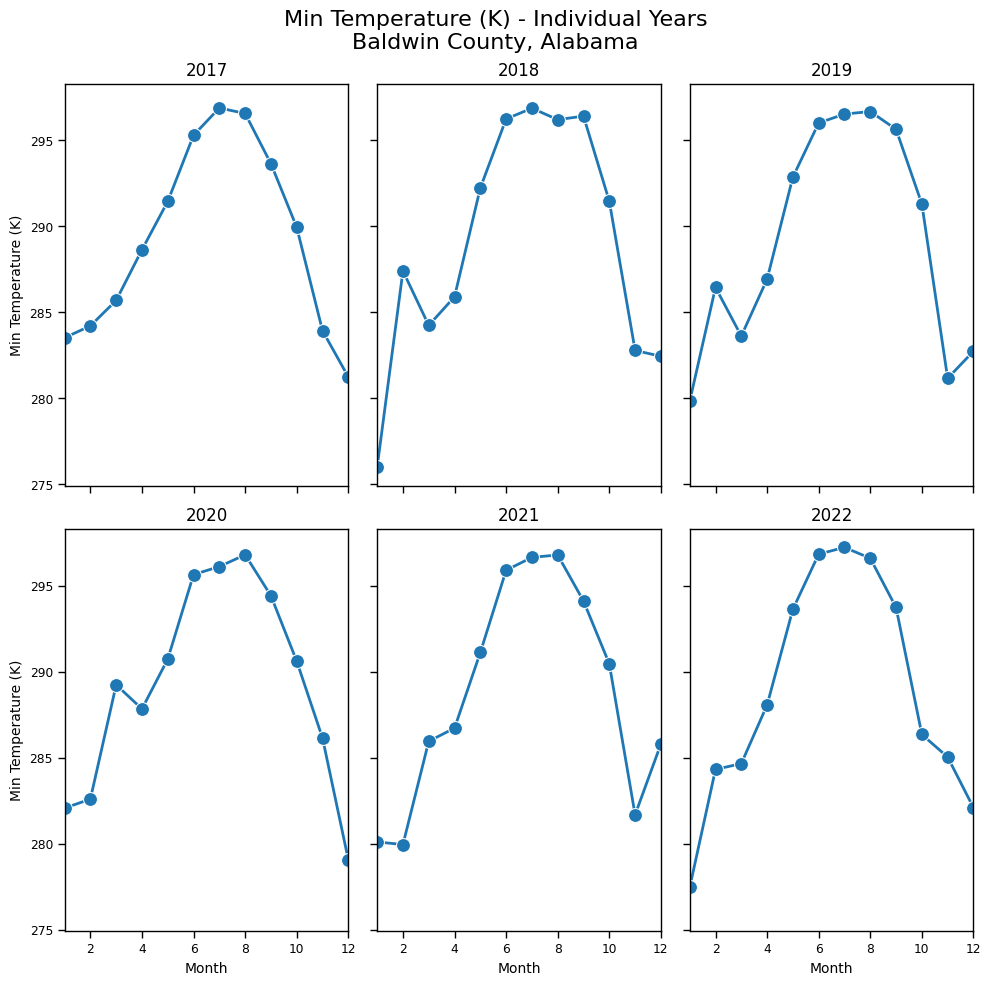

...

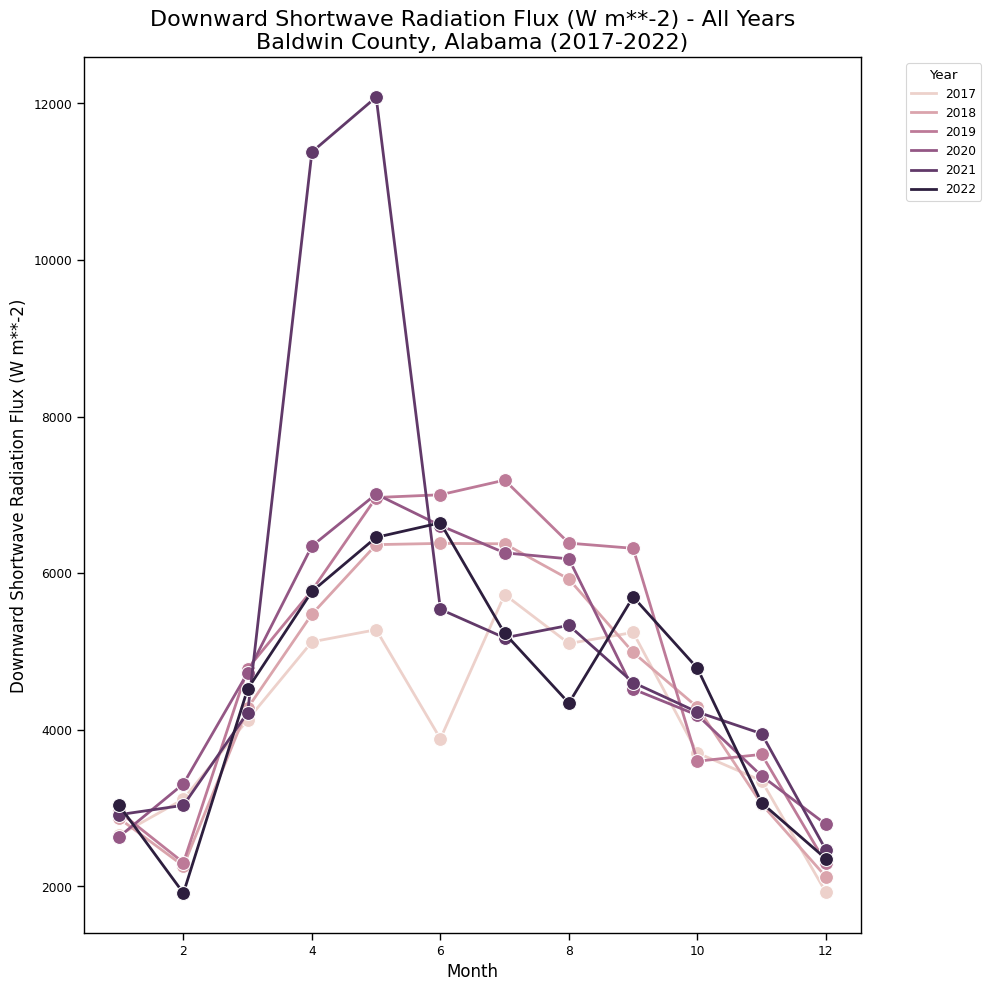

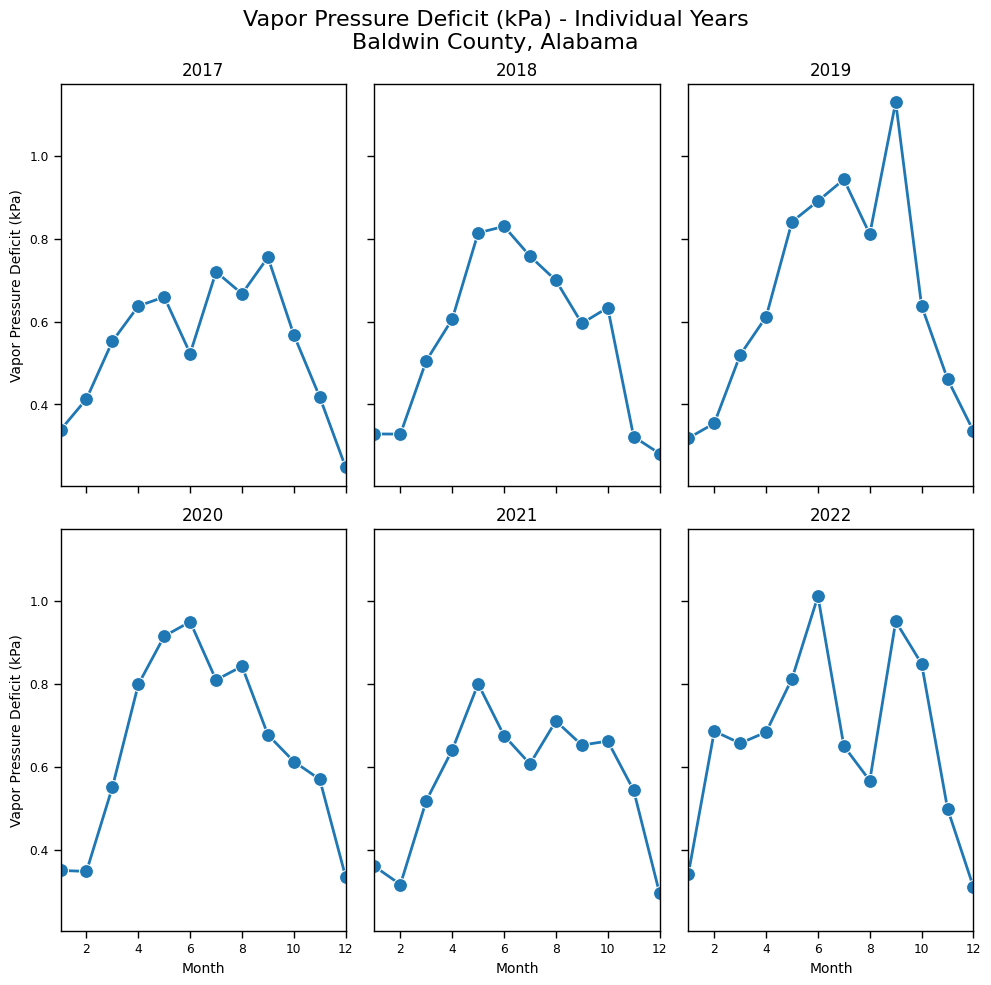

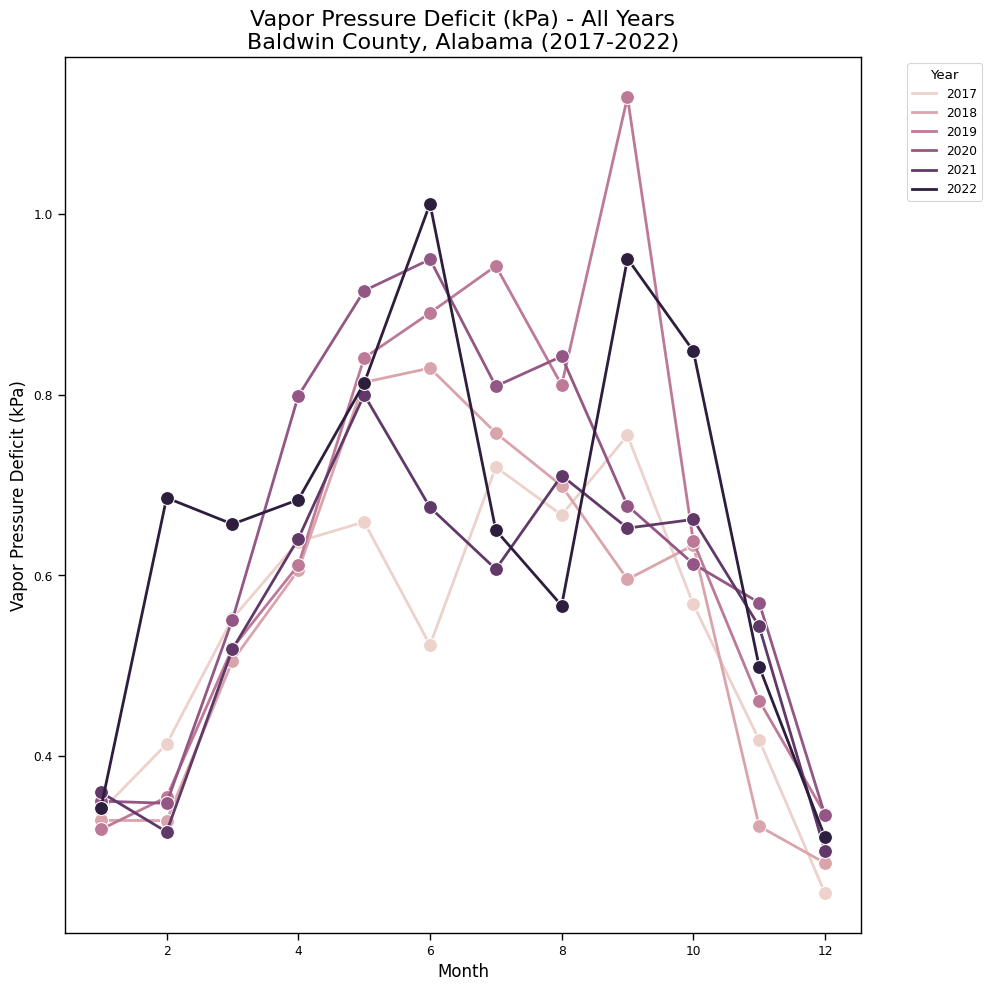

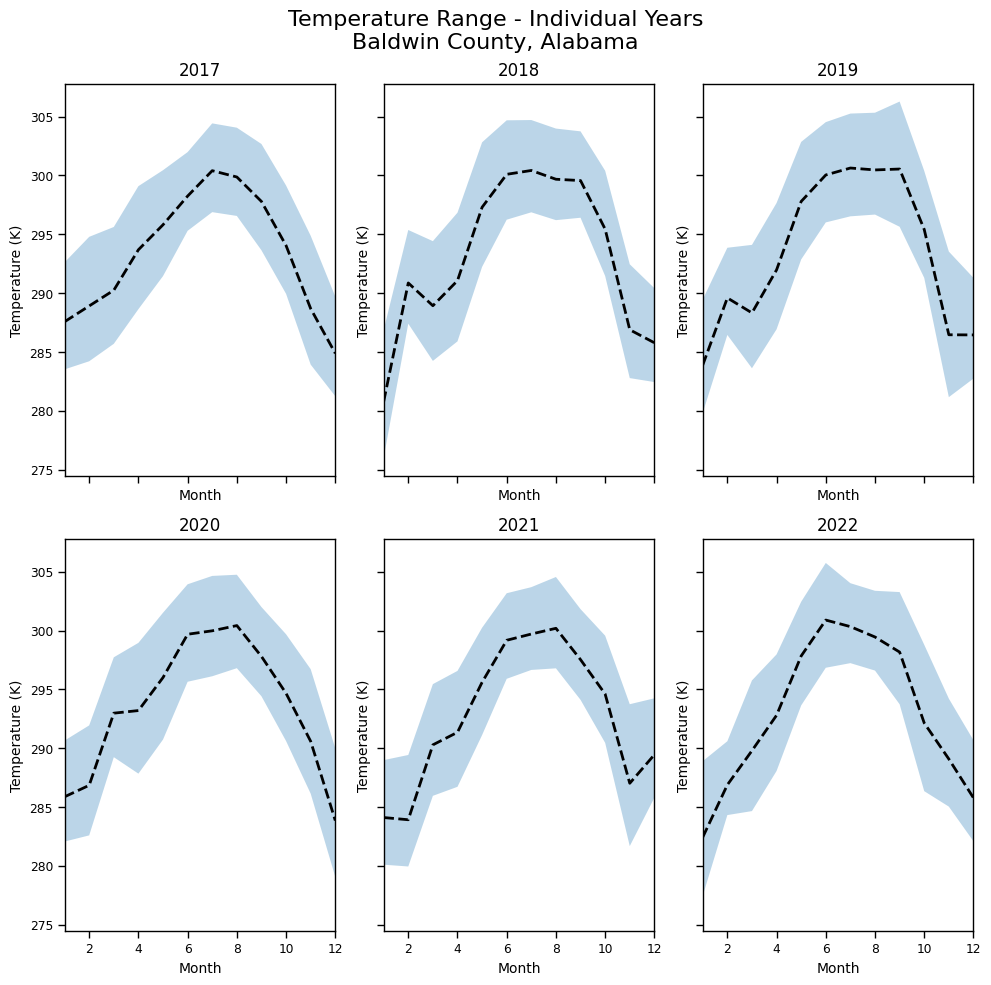

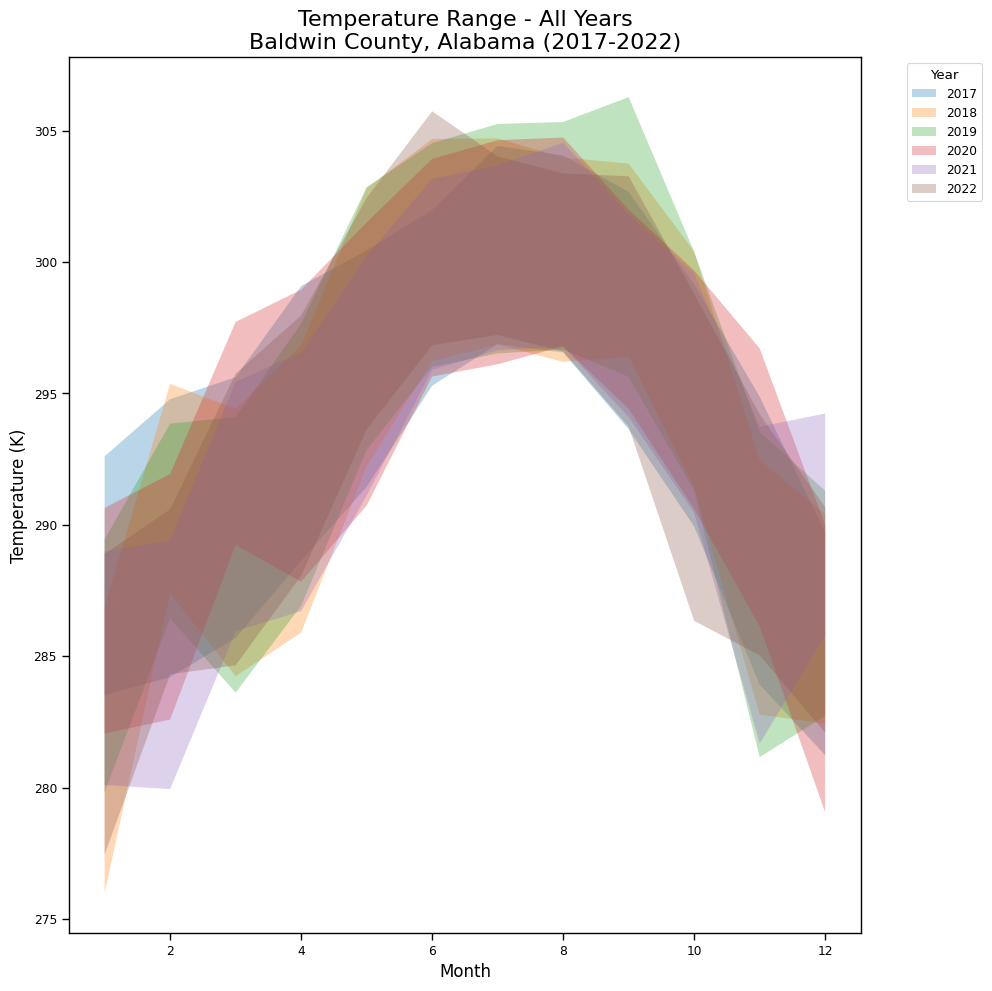

In [22]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Base path for where the WRF-HRRR data has been stored
base_path = "/kaggle/input/cropnet/HRRR"

def retrieve_county_data(years, FIPS_code="01003", interval="Monthly"):
    all_data = []
    path_template = "{}/AL/HRRR_01_AL_{}-{}.csv"
    assert interval in ["Monthly", "Daily"]
    
    for year in years:
        for month in range(1, 13):
            tmp_file_path = path_template.format(year, year, str(month).zfill(2))
            tmp_path = os.path.join(base_path, tmp_file_path)
            try:
                data = pd.read_csv(tmp_path)
                all_data.append(data)
            except FileNotFoundError:
                print(f"File not found: {tmp_path}")
                continue

    df = pd.concat(all_data)
    df["FIPS Code"] = df["FIPS Code"].astype(str).str.zfill(5)
    df['Year'] = df['Year'].astype(int)

    county_data = df[(df["Daily/Monthly"] == interval) & (df["FIPS Code"] == FIPS_code)]
    
    return county_data

def plot_feature(data, feature, years):
    # Figure 1: Subplots for each year
    fig_subplots = plt.figure(figsize=(10, 10))
    axes = fig_subplots.subplots(2, 3, sharex=True, sharey=True, subplot_kw={'xlim': (1, 12)})
    for ax, year in zip(axes.flatten(), years):
        year_data = data[data['Year'] == year]
        sns.lineplot(data=year_data, x='Month', y=feature, marker='o', ax=ax)
        ax.set_title(f"{year}", fontsize=12)
        ax.set_xlabel('Month', fontsize=10)
        ax.set_ylabel(feature, fontsize=10)
    
    fig_subplots.suptitle(f"{feature} - Individual Years\nBaldwin County, Alabama", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Figure 2: Master plot
    fig_master = plt.figure(figsize=(10, 10))
    ax_master = fig_master.add_subplot(111)
    sns.lineplot(data=data, x='Month', y=feature, hue='Year', marker='o', ax=ax_master)
    ax_master.set_title(f"{feature} - All Years\nBaldwin County, Alabama (2017-2022)", fontsize=16)
    ax_master.set_xlabel('Month', fontsize=12)
    ax_master.set_ylabel(feature, fontsize=12)
    ax_master.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

def plot_temperature_range(data, years):
    # Figure 1: Subplots for each year
    fig_subplots = plt.figure(figsize=(10, 10))
    axes = fig_subplots.subplots(2, 3, sharex=True, sharey=True, subplot_kw={'xlim': (1, 12)})
    for ax, year in zip(axes.flatten(), years):
        year_data = data[data['Year'] == year]
        ax.fill_between(year_data['Month'], year_data['Min Temperature (K)'], year_data['Max Temperature (K)'], alpha=0.3)
        ax.plot(year_data['Month'], year_data['Avg Temperature (K)'], color='black', linestyle='--', label='Average')
        ax.set_title(f"{year}", fontsize=12)
        ax.set_xlabel('Month', fontsize=10)
        ax.set_ylabel('Temperature (K)', fontsize=10)
    
    fig_subplots.suptitle("Temperature Range - Individual Years\nBaldwin County, Alabama", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Figure 2: Master plot
    fig_master = plt.figure(figsize=(10, 10))
    ax_master = fig_master.add_subplot(111)
    for year in years:
        year_data = data[data['Year'] == year]
        ax_master.fill_between(year_data['Month'], year_data['Min Temperature (K)'], year_data['Max Temperature (K)'], alpha=0.3, label=str(year))
#     ax_master.plot(data['Month'], data['Avg Temperature (K)'], color='black', linestyle='--', label='Average')
    ax_master.set_title("Temperature Range - All Years\nBaldwin County, Alabama (2017-2022)", fontsize=16)
    ax_master.set_xlabel('Month', fontsize=12)
    ax_master.set_ylabel('Temperature (K)', fontsize=12)
    ax_master.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Retrieve data for Baldwin County, Alabama from 2017 to 2022
years = range(2017, 2023)
county_data = retrieve_county_data(years)

# Updated list of features to visualize
features = [
    'Avg Temperature (K)', 
    'Max Temperature (K)',
    'Min Temperature (K)', 
    'Precipitation (kg m**-2)',
    'Relative Humidity (%)', 
    'Wind Gust (m s**-1)', 
    'Wind Speed (m s**-1)',
    'U Component of Wind (m s**-1)', 
    'V Component of Wind (m s**-1)',
    'Downward Shortwave Radiation Flux (W m**-2)',
    'Vapor Pressure Deficit (kPa)'
]

# Plot each feature
for feature in features:
    plot_feature(county_data, feature, years)

# Plot temperature range
plot_temperature_range(county_data, years)

In [21]:
import pandas as pd
import pandas_profiling as pp
pp.ProfileReport(county_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]